# Plots for Figures in the Paper for Asymmetric N (N+ = 100, N- = 400)

Previously, I made plots using $N = 1000$ (see `paper_figs_n_1000.ipynb`). Here, I repeat those plots accounting for the asymmetry in chain length measured by the Prabhu group (see `yuanchi_mw_mn_N_experiments.rtf`).

The data were obtained using Chris Balzer's liquid state theory code.

In [ ]:
%load_ext autoreload
%autoreload 2

import numpy as np
import glob
import pandas as pd

# plotting
from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']
import matplotlib.pyplot as plt

import salt
import pe
import plot

import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio

from bokeh.io import output_notebook
from bokeh.plotting import show

from importlib import reload
reload(salt)
reload(pe)

output_notebook()


# USER PARAMETERS
save_folder = '../../PAPERS/ccls/figs/asymN/'
Z = 1 # charge per monomer (same for polyanion and polycation)
# range of temperatures considered (liquid water) [K]
T_range = [273.15, 373.15]
# list of salt [KBr] concentrations [mol/L]
rho_s_list = [1.57, 1.78, 1.82]
# list of polyanion [PSS] concentrations [mol/L]
rho_p_list = [0.135]
# accurate choice for sigma based on Bjerrum length of water (see fit_sigma_to_prabhu_data.ipynb)
sigma = 4E-10 # [m]
# conversion of meters to Angstroms [A]
m_2_A = 1E10
# conversion from beads/sigma^3 to mol/L (M)
beads_2_M = pe.get_beads_2_M(sigma, SI=True)

## Figure 1: LCST at Fixed Salt Reservoir Concentration

In [9]:
reload(salt)
### DATA PARAMETERS ###
# folder with binodal data
data_folder = '../salt/asymN400/' # must contain mu in .PD file
# concentration of salt in reservoir [mol/L]
rho_salt_M = 1.95
# converts to beads/sigma^3
rho_salt = rho_salt_M/beads_2_M
# folder with chemical potential calculations for salt solution
mu_salt_folder = '../salt/mu_salt_1000/'
### FORMATTING PARAMETERS ###
# number of points to have in plot
n_pts = 100000
# parameter to plot for z axis
z_name = 'T [C]'
# binodal at fixed temperature
z_rough = 30
# range of Bjerrum lengths to plot
lB_lo = 1.62
lB_hi = 2.22
# fixed composition [M]
rho_s = 1.7
rho_p = 0.9
# index for critical point
i_cp = -2 # last line has some junk?
# fixed coordinates defining outlines of binodal surface
T_for_outline = [0, 100]
rho_s_for_outline = []

quiet = True

# adjusts for different formatting of Chris's code's output from Pengfei's
naming_structure = 'NA(100)NB(400)lB(*)f(1.000)'
mu_naming_structure = 'NA(1000)NB(1000)lB(*)f(1.000)'
ext = 'output.dat'

In [10]:
# loads data
data = salt.load_data(data_folder, ext=ext,
                lB_lo=lB_lo, lB_hi=lB_hi, naming_structure=naming_structure)

In [11]:
# computes data
data_3d, data_mu, data_z, \
data_cp, data_comp, data_outlines = salt.data_fig1(data, mu_salt_folder, rho_salt, T_range, 
                                                    sigma, z_name, beads_2_M, n_pts, z_rough, 
                                                   lB_lo=lB_lo, lB_hi=lB_hi, rho_s=rho_s, rho_p=rho_p,
                                                     ext=ext, naming_structure=naming_structure,
                                                   mu_naming_structure=mu_naming_structure, i_cp=i_cp, 
                                                   quiet=quiet, T_for_outline=T_for_outline,
                                                      rho_s_for_outline=rho_s_for_outline)

AssertionError: len(mu_conc) = 0 in salt.make_df_mu(), loading from ../salt/mu_salt_1000/

In [12]:
################### PLOT ###################################
# parameters
fs = 14 # tick label font size
op = 0.012
ms_bin = 15
lw_bin = 30
lw_fix = 45
lw_crit = 30
lw_outline = 6

# colors
c1_T = 'blue'
c2_T = 'red'
c1_fix = 'blue'
c2_fix = 'red'
c_crit = 'black'
c_outline = '#1A2D4A'
mode = 'markers'
# figure size
width = 6000 # pixels
height = 5000 # pixels
# offset of axes from true 0 (so they are not hidden by planes in background)
offset = 0.003
# indicates which indices of Bjerrum lengths to skip
skip = []

# coordinates of camera eye
eye_xyz = (1.5, 1.5, 1.5)

# Sets vertical axis limits
x_range = [-0.1, 5.5]
y_range = [0, 2.4]
z_range = [0, 103.5]

plot_params = (x_range, y_range, z_range, eye_xyz, op, ms_bin, lw_bin, 
    lw_fix, lw_crit, lw_outline, c1_T, c2_T, c1_fix, c2_fix, 
    c_crit, c_outline, mode, width, height, fs, offset)

############### PLOTTING ########################
fig = plot.fig1(data_3d, data_cp, data_z, data_mu, plot_params, 
                fixed_comp=True, data_comp=data_comp, toc_fig=True,
                data_outlines=data_outlines, skip=skip)

save_name = 'toc_lcst_fixed_salt.pdf'

# # shows figure
# fig.show()

# saves figure
pio.write_image(fig, save_folder + save_name, width=width, height=height)

## Figure 2(ALT): Different Projections of Binodal Under Fixed Concentration of Salt in Saltwater Reservoir

In [24]:
# folder with binodal data
data_folder = 'salt/vary_params/' # must contain mu in .PD file
# range of Bjerrum lengths to plot
lB_lo = 1.6
lB_hi = 2.2

# loads data
data = salt.load_data(data_folder, lB_lo=lB_lo, lB_hi=lB_hi, naming_structure=naming_structure, ext=ext)

Could not walk through files in salt/mu_salt_1000\NA(1000)NB(1000)lB(2.109)f(1.000)
Could not walk through files in salt/mu_salt_1000\NA(1000)NB(1000)lB(2.109)f(1.000)


C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.



Could not walk through files in salt/mu_salt_1000\NA(1000)NB(1000)lB(2.109)f(1.000)
Could not walk through files in salt/mu_salt_1000\NA(1000)NB(1000)lB(2.109)f(1.000)
Could not walk through files in salt/mu_salt_1000\NA(1000)NB(1000)lB(2.109)f(1.000)
Could not walk through files in salt/mu_salt_1000\NA(1000)NB(1000)lB(2.109)f(1.000)


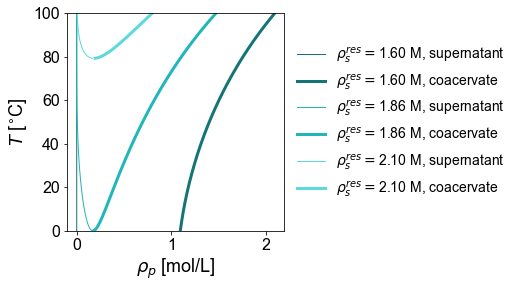

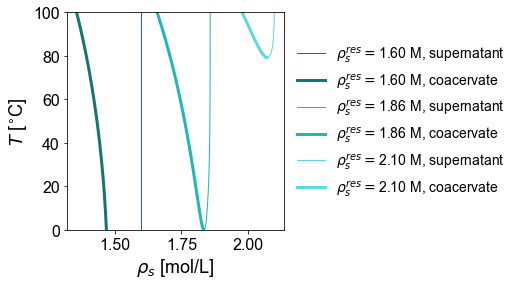

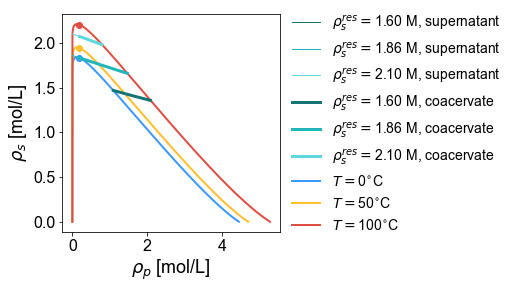

In [28]:
# PLOT PARAMETERS
# List of concentrations of salt in the saltwater reservoir [M]
rho_salt_M_list_list = [[1.6, 1.858, 2.10]]
# folder with chemical potential calculations for salt solution
mu_salt_folder = 'salt/mu_salt_1000/'
# range of temperatures to plot
T_range = [273, 373]
# plot temperature in Celsius? (or Kelvin?)
T_cels = True
# parameter to plot for z axis
z_name = 'T [K]'
# list of colors
color_list = ['#147476', '#20B6BA', '#5CD8DE'] # dark teal, teal, neon blue
lB_color_list = ['#3B99FE', '#FFBF2E', '#E04D43'] # blue, yellow, red
x_lim = None
marker = ''
fill_left = 'none'
fill_right = 'full'
lw1 = 1
lw2 = 4
units_rho = 'mol/L'
lgnd_out = True
# Bjerrum lengths to plot binodals on polymer-salt plane
lB_list = [1.623, 1.777, 2.181] # [0, 50, 100] degrees C
   

for rho_salt_M_list in rho_salt_M_list_list:
    # plots binodal projections
    ax_pT, ax_sT, ax_ps = plot.binodal_proj_fixed_conc(data, mu_salt_folder, rho_salt_M_list, 
                                                color_list, T_range, sigma, z_name, beads_2_M, 
                                               lB_list, lB_color_list, T_cels=T_cels, marker=marker, 
                                                       naming_structure=naming_structure, ext=ext)

    # formats plots
    ax_pT = plot.format_binodal(ax_pT, r'$\rho_p$', units_rho, T_range, T_cels=T_cels, y_lim=(0, 100), square_box=True)    
    ax_sT = plot.format_binodal(ax_sT, r'$\rho_s$', units_rho, T_range, T_cels=T_cels, y_lim=(0, 100), square_box=True)
    ax_ps = plot.format_binodal(ax_ps, r'$\rho_p$', units_rho, T_range, y_label=r'$\rho_s$ [mol/L]', square_box=True)
    
    # *Extra formatting for polymer-salt plot because we will use its legend*
    # sorts legend order for polymer-salt plot by supernatant, coacervate, then temperature
    sorted_keys = ['supernatant', 'coacervate', '$T']
    ax_ps = plot.sort_lgnd_labels(ax_ps, sorted_keys)

## Figure 2: Different Projections of Binodal Under Fixed Polymer and Salt Concentrations

In [6]:
# loads data
data_folder = 'salt/vary_params/'
data = salt.load_data(data_folder, naming_structure=naming_structure, ext=ext, lB_lo=lB_lo, lB_hi=lB_hi)

C:\Users\andyl\OneDrive - California Institute of Technology\Documents\Research\Wang\complex_coacervate\salt.py:99: RuntimeWarning:

divide by zero encountered in true_divide

C:\Users\andyl\OneDrive - California Institute of Technology\Documents\Research\Wang\complex_coacervate\salt.py:101: RuntimeWarning:

invalid value encountered in add

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\ana

lB = 1.623 gives 1 phase for rho_p = 0.172 [mol/L],rho_s = 2.080 [mol/L].
lB = 1.777 gives 1 phase for rho_p = 0.172 [mol/L],rho_s = 2.080 [mol/L].


C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.



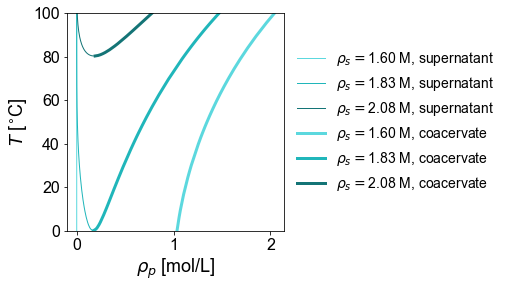

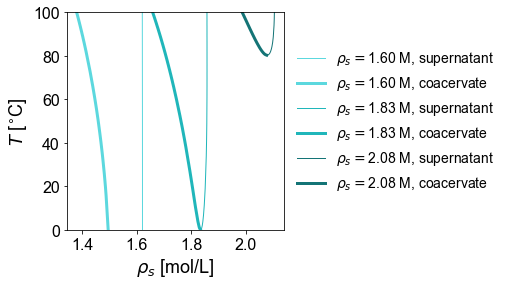

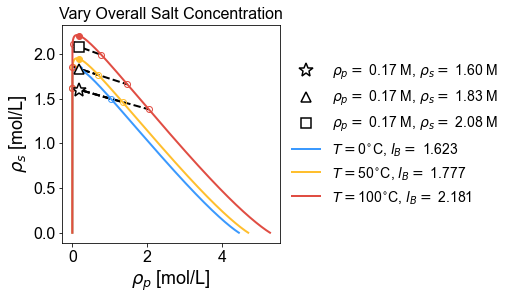

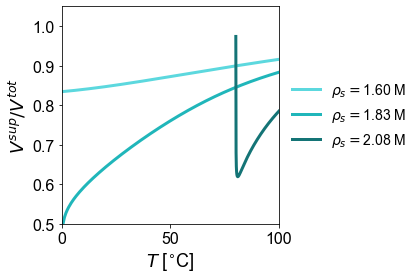

In [8]:
# Temperature in Celsius on plots?
T_cels = True
# square bounding box of plot
square_box = True

# list of Bjerrum lengths to plot
lB_list = [1.623, 1.777, 2.181]
# critical concentration at 50 C
T_c = 0
rho_pc_list, rho_sc_list, T_c_list = data_cp
i_c = np.argmin( (T_c_list - T_c)**2 )
rho_p = 2*4.11421836e-03*beads_2_M # rho_pc_list[i_c]
rho_sc = 8.78330994e-02*beads_2_M #rho_sc_list[i_c]

rho_s_list = [1.6, rho_sc, 2.08] # second value is critical salt concentration

# plot parameters
lw=3 # line width for binodals
# list of colors
color_list =  ['#5CD8DE', '#20B6BA', '#147476'] # dark teal, teal, neon blue
lB_color_list = ['#3B99FE', '#FFBF2E', '#E04D43'] # blue, yellow, red

# polymer-temperature plane
ax = plot.binodal_vary_rho(data, rho_s_list, rho_p, 's', beads_2_M, x_var='polyelectrolyte', x_label=r'$\rho_p$',
                           marker='', lw=lw, colors=color_list, sigma=sigma, T_cels=T_cels, title='',
                           square_box=square_box)
# *Extra formatting for polymer-salt plot because we will use its legend*
# sorts legend order for polymer-salt plot by supernatant, coacervate, then temperature
sorted_keys = ['supernatant', 'coacervate', '$T']
ax = plot.sort_lgnd_labels(ax, sorted_keys)

# plt.savefig('test.pdf', bbox_inches='tight')
# salt-temperature plane
ax = plot.binodal_vary_rho(data, rho_s_list, rho_p, 's', beads_2_M, x_var='salt', x_label=r'$\rho_s$',
                          marker='', lw=lw, colors=color_list, sigma=sigma, T_cels=T_cels, title='',
                          square_box=square_box)
# polymer-salt plane
ax = plot.binodal_rho_rho(data, lB_list, rho_s_list, rho_p, 's', beads_2_M, 
                          colors=lB_color_list, sigma=sigma, T_cels=T_cels, square_box=square_box)
# sorts legend labels
sorted_keys = [r'$\rho_p', '$T']
ax = plot.sort_lgnd_labels(ax, sorted_keys)

# volume fraction of supernatant vs. temperature
y_lim = [0.5, 1.05]
ax = plot.alpha_vary_rho(data, rho_s_list, rho_p, 's', beads_2_M, celsius=T_cels, y_lim=y_lim,
                         marker='', lw=lw, colors=color_list, sigma=sigma, title='', square_box=square_box)

#### Zoom in on Gap

I will zoom in on the gap between the supernatant and coacervate branches of the binodal to see if it is large enough to show clearly in an inset and if the gap is the result of the limits of mass conservation or just the discrete nature of the data.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.



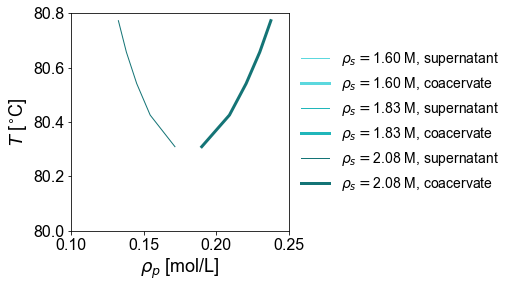

In [11]:
ax = plot.binodal_vary_rho(data, rho_s_list, rho_p, 's', beads_2_M, x_var='polyelectrolyte', x_label=r'$\rho_p$',
                           marker='', lw=lw, colors=color_list, sigma=sigma, T_cels=T_cels, title='',
                           square_box=square_box, T_range=[80+273.15, 80.8+273.15], x_lim=[0.1, 0.25])

It appears that the gap in the binodal is a result of the constraint of fixed overall composition and not of the finite spacing between temperatures.

Now I'll check what the gap looks like along the salt axis.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.



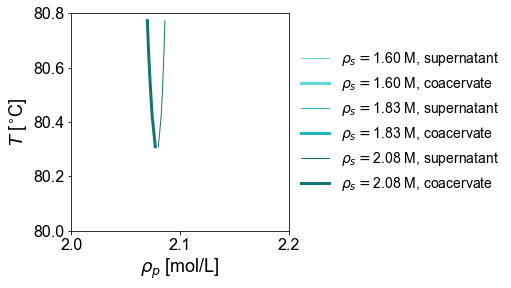

In [12]:
ax = plot.binodal_vary_rho(data, rho_s_list, rho_p, 's', beads_2_M, x_var='salt', x_label=r'$\rho_p$',
                           marker='', lw=lw, colors=color_list, sigma=sigma, T_cels=T_cels, title='',
                           square_box=square_box, T_range=[80+273.15, 80.8+273.15], x_lim=[2, 2.2])

#### Repeat with Custom Polymer and Salt Concentrations

Because the critical line has almost constant polymer concentration, varying salt will not take us from a critical point to a wide gap to demonstrate the two regimes, as was the case when $N = 100$. To demonstrate the difference between these regimes, we will perturb the polymer concentration slightly in the last case.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.



lB = 1.623 gives 1 phase for rho_p = 0.050 [mol/L],rho_s = 2.000 [mol/L].
lB = 1.777 gives 1 phase for rho_p = 0.050 [mol/L],rho_s = 2.000 [mol/L].


C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.



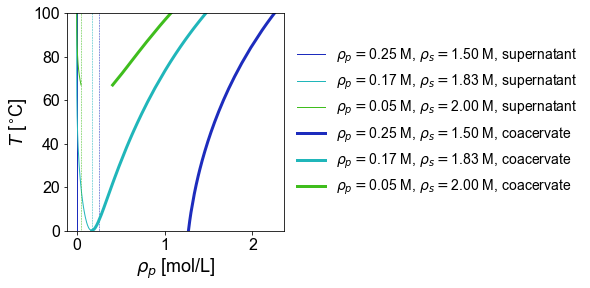

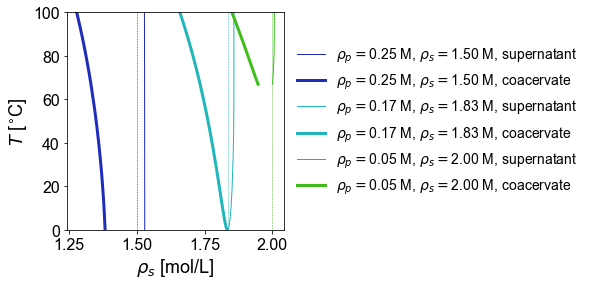

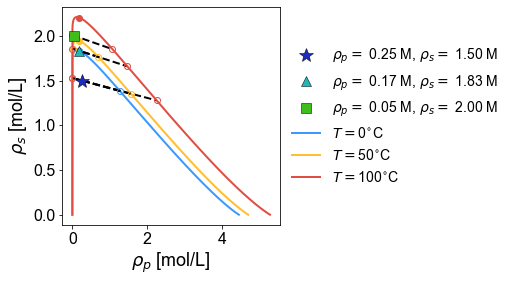

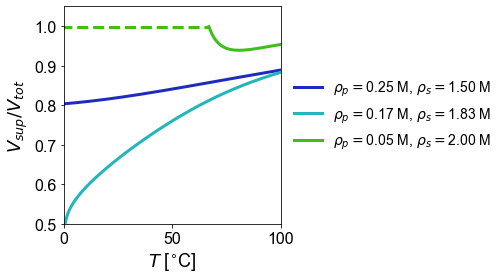

In [23]:
# Temperature in Celsius on plots?
T_cels = True
# square bounding box of plot
square_box = True

# list of Bjerrum lengths to plot
lB_list = [1.623, 1.777, 2.181]
# critical concentration at 50 C
T_c = 0
rho_pc_list, rho_sc_list, T_c_list = data_cp
i_c = np.argmin( (T_c_list - T_c)**2 )
rho_pc = 2*4.11421836e-03*beads_2_M # rho_pc_list[i_c]
rho_sc = 8.78330994e-02*beads_2_M #rho_sc_list[i_c]

rho_p_list = [0.25, rho_pc, 0.05]
rho_s_list = [1.5, rho_sc, 2] # second value is critical salt concentration

# Varies polymer, fixing salt--LOOKS REALLY BAD AESTHETICALLY
# rho_p_list = [rho_p-0.1, rho_p, rho_p+0.5]
# rho_s_list = [rho_sc, rho_sc, rho_sc] # second value is critical salt concentration


# plot parameters
lw=3 # line width for binodals
# list of colors
color_list =  ['#1D2CBD', '#20B6BA', '#3FBD1D'] # blue, teal, green #['#5CD8DE', '#20B6BA', '#147476'] # neon blue, teal, dark teal
lB_color_list = ['#3B99FE', '#FFBF2E', '#E04D43'] # blue, yellow, red

# polymer-temperature plane
ax = plot.binodal_custom_rho(data, rho_p_list, rho_s_list, beads_2_M, x_var='polyelectrolyte', x_label=r'$\rho_p$',
                           marker='', lw=lw, colors=color_list, sigma=sigma, T_cels=T_cels,
                           square_box=square_box, plot_fixed_rho=True)
# *Extra formatting for polymer-salt plot because we will use its legend*
# sorts legend order for polymer-salt plot by supernatant, coacervate, then temperature
sorted_keys = ['supernatant', 'coacervate', '$T']
ax = plot.sort_lgnd_labels(ax, sorted_keys)

# plt.savefig('test.pdf', bbox_inches='tight')
# salt-temperature plane
ax = plot.binodal_custom_rho(data, rho_p_list, rho_s_list, beads_2_M, x_var='salt', x_label=r'$\rho_s$',
                          marker='', lw=lw, colors=color_list, sigma=sigma, T_cels=T_cels,
                          square_box=square_box, plot_fixed_rho=True)
# polymer-salt plane
x_lim = None #[0, 2]
y_lim = None #[1.25, 2.25]
ax = plot.binodal_custom_rho_rho(data, lB_list, rho_p_list, rho_s_list, beads_2_M, 
                          colors=lB_color_list, colors_symbols=color_list, sigma=sigma, 
                                 x_lim=x_lim, y_lim=y_lim,
                                 T_cels=T_cels, square_box=square_box, mew=0.5)
# sorts legend labels
sorted_keys = [r'$\rho_p', '$T']
ax = plot.sort_lgnd_labels(ax, sorted_keys)

# volume fraction of supernatant vs. temperature
y_lim = [0.5, 1.05]
ax = plot.alpha_custom_rho(data, rho_p_list, rho_s_list, beads_2_M, celsius=T_cels, y_lim=y_lim,
                         marker='', lw=lw, colors=color_list, sigma=sigma, square_box=square_box)

lB = 1.623 gives 1 phase for rho_p = 0.172 [mol/L],rho_s = 1.984 [mol/L].
lB = 1.623 gives 1 phase for rho_p = 0.022 [mol/L],rho_s = 1.834 [mol/L].
lB = 1.623 gives 1 phase for rho_p = 0.322 [mol/L],rho_s = 1.834 [mol/L].
lB = 1.777 gives 1 phase for rho_p = 0.172 [mol/L],rho_s = 1.984 [mol/L].


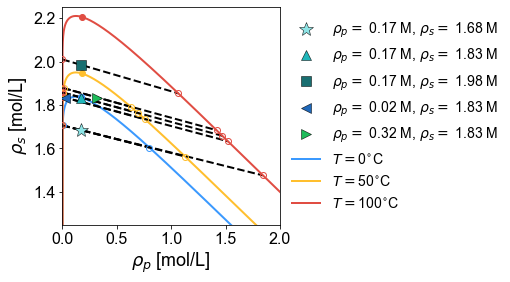

In [12]:
x_lim = [0, 2]
y_lim = [1.25, 2.25]
# polymer-salt plane
ax = plot.binodal_custom_rho_rho(data, lB_list, rho_p_list, rho_s_list, beads_2_M, 
                          colors=lB_color_list, colors_symbols=color_list, sigma=sigma,
                                 x_lim=x_lim, y_lim=y_lim,
                                 T_cels=T_cels, square_box=square_box, mew=0.5)
# sorts legend labels
sorted_keys = [r'$\rho_p', '$T']
ax = plot.sort_lgnd_labels(ax, sorted_keys)

## Figure 3: Binodal in Salt-Polymer Plane for Fixed Salt and Polymer Concentrations

In [5]:
# loads data
data_folder = 'salt/vary_params/'
data = salt.load_data(data_folder, naming_structure=naming_structure, ext='output.dat')

lB = 1.623 gives 1 phase for rho_p = 0.300 [mol/L],rho_s = 2.000 [mol/L].
lB = 1.777 gives 1 phase for rho_p = 0.300 [mol/L],rho_s = 2.000 [mol/L].
lB = 1.623 gives 1 phase for rho_p = 1.500 [mol/L],rho_s = 1.350 [mol/L].
lB = 1.623 gives 1 phase for rho_p = 2.000 [mol/L],rho_s = 1.350 [mol/L].
lB = 1.777 gives 1 phase for rho_p = 2.000 [mol/L],rho_s = 1.350 [mol/L].


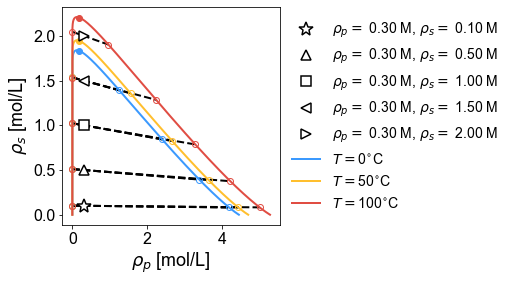

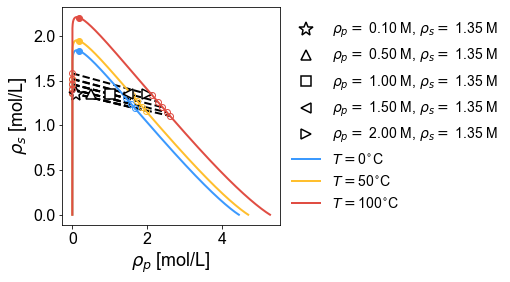

In [10]:
# Temperature in Celsius?
T_cels = True
# square plot box?
square_box = True

# Parameters
colors = lB_color_list
# list of salt [KBr] concentrations [mol/L]
rho_s_list = [0.1, 0.5, 1.0, 1.5, 2.0]
# list of polyanion [PSS] concentrations [mol/L]
rho_p_list = [0.1, 0.5, 1.0, 1.5, 2.0]

################ VARIES SALT CONCENTRATION ###############

# list of Bjerrum lengths to plot
lB_list = [1.623, 1.777, 2.181]

# fixed overall concentration of polymer
rho_p = 0.3 # [M]

# plots binodal
ax = plot.binodal_rho_rho(data, lB_list, rho_s_list, rho_p, 's', beads_2_M, title='',
                          colors=colors, sigma=sigma, T_cels=T_cels, square_box=square_box)
# sorts legend labels
sorted_keys = [r'$\rho_p', '$T']
ax = plot.sort_lgnd_labels(ax, sorted_keys)

############ VARIES POLYMER CONCENTRATION ####################

# list of Bjerrum lengths to plot
lB_list = [1.623, 1.777, 2.181]

# fixed overall salt concentration
rho_s  = 1.35 # [M]


# plots binodal
ax = plot.binodal_rho_rho(data, lB_list, rho_p_list, rho_s, 'p', beads_2_M, title='',
                          colors=colors, sigma=sigma, T_cels=T_cels, square_box=square_box)
# sorts legend labels
sorted_keys = [r'$\rho_p', '$T']
ax = plot.sort_lgnd_labels(ax, sorted_keys)

############ NO TIE LINES ####################

# # list of Bjerrum lengths to plot
# lB_list = [1.623, 1.777, 2.181]

# # fixed overall salt concentration
# rho_s  = 1 # [M]

# # plots binodal
# ax = plot.binodal_rho_rho(data, lB_list, [], rho_s, 'p', beads_2_M, colors=colors, sigma=sigma)
# # sorts legend labels
# sorted_keys = [r'$\rho_p', '$T']
# ax = plot.sort_lgnd_labels(ax, sorted_keys)

## Figure 4: Comparing Effect of Salt on Binodal between Theory and Experiment

We just show the plots produced by theory. The results from experiments are given in Ali et al. (2019) *Macromol.*

In [27]:
# loads data
data_folder = 'salt/vary_params/'
data = salt.load_data(data_folder, naming_structure=naming_structure, ext='output.dat')

In [29]:
line=True
marker=False


# sets total polymer concentration [mol/L]
rho_p = 0.27
# sets x and y axis limits
x_lim = (-0.05, 1.3) # [mol/L]
y_lim = (0, 60) # [C]
# sets temperature range
T_range_fig3 = [273, 333]

# list of salt concentrations to consider [mol/L]
rho_s_list = [1.57, 1.78, 1.82]

for rho_s in rho_s_list:
    # computes polycation concentrations at different temperatures for fixed polymer and salt [mol/L]
    rho_PCI_list, rho_PCII_list, _, _, lB_arr, _ = salt.fixed_rho_total(data, rho_p, rho_s, beads_2_M)

    # plots binodal
    title = '{0:.2f} M Salt, {1:.2f} M Polymer'.format(rho_s, rho_p)
    show(plot.binodal(lB_arr, rho_PCI_list, rho_PCII_list, title=title, beads_2_M=1, n_tie_lines=0, deg_C=True, 
                     sigma=sigma, T_range=T_range, x_lim=x_lim, y_lim=y_lim, marker=marker, line=line))

##### Compare to Predicted Binodal for the Concentrations Used in the Ali et al. (2019) Experiment

In [30]:
reload(plot)

# loads data
data_folder = 'salt/asymN'
naming_structure = 'NA(100)NB(300)lB(*)f(1.000)'
data = salt.load_data(data_folder, naming_structure=naming_structure, ext='output.dat')

In [31]:
# sets total polymer concentration [mol/L]
rho_p = 0.6
# sets x and y axis limits
x_lim = (-0.05, 1.3) # [mol/L]
y_lim = (0, 60) # [C]
# sets temperature range
T_range_fig3 = [273, 333]

# list of salt concentrations to consider [mol/L]
rho_s_list = [1.6, 1.85, 1.9]

for rho_s in rho_s_list:
    # computes polycation concentrations at different temperatures for fixed polymer and salt [mol/L]
    rho_PCI_list, rho_PCII_list, _, _, lB_arr, _ = salt.fixed_rho_total(data, rho_p, rho_s, beads_2_M)
    # plots binodal
    title = '{0:.2f} M Salt, {1:.2f} M Polymer'.format(rho_s, rho_p)
    show(plot.binodal(lB_arr, rho_PCI_list, rho_PCII_list, title=title, beads_2_M=1, n_tie_lines=0, deg_C=True, 
                     T_range=T_range, x_lim=x_lim, y_lim=y_lim))

[1.62  1.65  1.654 1.656 1.658 1.66  1.662 1.664 1.666 1.668 1.67  1.672
 1.674 1.676 1.678 1.68  1.682 1.684 1.686 1.688 1.69  1.692 1.694 1.696
 1.698 1.7   1.702 1.704 1.706 1.708 1.71  1.712 1.714 1.716 1.718 1.72
 1.722 1.724 1.726 1.728 1.73  1.732 1.734 1.736 1.738 1.74  1.742 1.744
 1.746 1.748 1.75  1.752 1.754 1.756 1.758 1.76  1.762 1.764 1.766 1.768
 1.77  1.772 1.774 1.776 1.778 1.78  1.782 1.784 1.786 1.788 1.79  1.792
 1.794 1.796 1.798 1.8   1.802 1.804 1.806 1.808 1.81  1.812 1.814 1.816
 1.818 1.82  1.822 1.824 1.826 1.828 1.83  1.832 1.834 1.836 1.838 1.84
 1.842 1.844 1.846 1.848 1.85  1.852 1.854 1.856 1.858 1.86  1.862 1.864
 1.866 1.868 1.87  1.872 1.874 1.876 1.878 1.88  1.882 1.884 1.886 1.888
 1.89  1.892 1.894 1.896 1.898 1.9   1.902 1.904 1.906 1.908 1.91  1.912
 1.914 1.916 1.918 1.92  1.922 1.924 1.926 1.928 1.93  1.932 1.934 1.936
 1.938 1.94  1.942 1.944 1.946 1.948 1.95  1.952 1.954 1.956 1.958 1.96
 1.962 1.964 1.966 1.968 1.97  1.972 1.974 1.976 1.978

ZeroDivisionError: division by zero

### New Approach: Plot with Matplotlib and Overlay Experimental Data

Now that I have recorded the experimental data in a data file, I can load the data and plot the points directly on top of the liquid state theory's predictions

C:\Users\andyl\OneDrive - California Institute of Technology\Documents\Research\Wang\complex_coacervate\salt.py:191: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andyl\OneDrive - California Institute of Technology\Documents\Research\Wang\complex_coacervate\salt.py:192: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\andyl\OneDrive - California Institute of Technology\Documents\Research\Wang\complex_coacervate\salt.py:194: SettingWithCopyWarning:


A value is trying to be set on a copy of a 

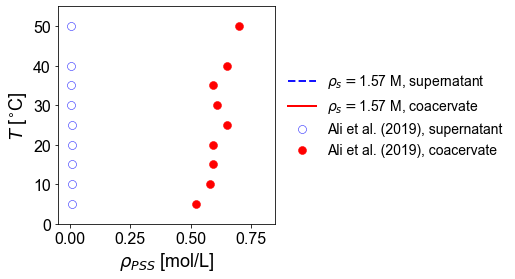

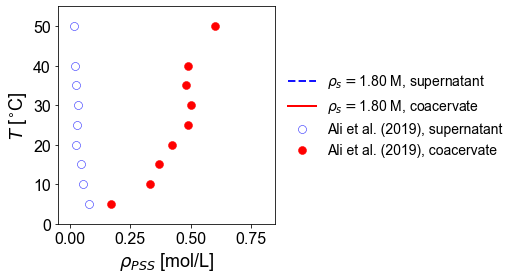

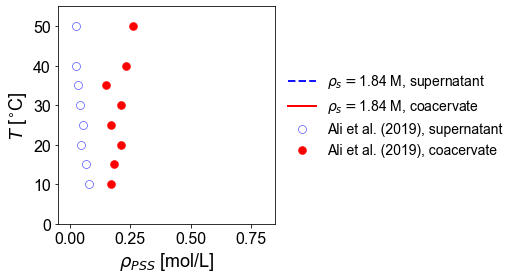

In [5]:
exp_data_filepath = '../References/CCLS/Data/prabhu_experimental_data_raw.csv'
rho_s_list = [1.75, 2.0, 2.05]
rho_p = 0.3
T_range = [273.15, 328.15]
x_lim = [-0.05, 0.85]
mew = 0.5
conv_vals = True
simple_red = 0.9 # set to 1 to do other conversion
            

# LOADS EXPERIMENTAL DATA
df_exp = pd.read_csv(exp_data_filepath)
# converts concentrations reported by Ali et al. 2019 from mol / L (solvent) to mol / L (solution) 
df_exp = salt.df_conv_ali_conc(df_exp, simple_red=simple_red)

# PLOTS EXPERIMENTAL DATA ON PREDICTED RESULT FOR EACH SALT CONCENTRATION
_ = plot.compare_to_ali_2019(data, df_exp, rho_s_list, rho_p, sigma, T_range, x_lim=x_lim, 
                             mew=mew, conv_vals=conv_vals)

## Figure 5: Effect of Polymer on Binodal Determines Sign of Tie-line Slopes

Produced in powerpoint.

## S1: Bjerrum Length vs. Temperature

Loading data for lB = 3.150 failed.
Loading data for lB = 3.200 failed.
Loading data for lB = 3.250 failed.


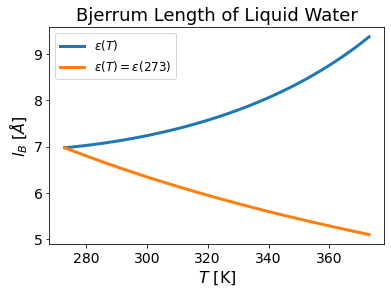

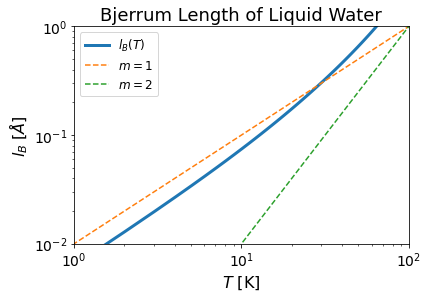

In [14]:
data_folder = 'salt/n_1000/'
data = salt.load_data(data_folder, naming_structure=naming_structure, ext='output.dat')

# plot parameters
ax_fs = 16
t_fs = 18
tk_fs = 14
l_fs = 12


# Computes Bjerrum length in desired temperature range
T_arr = np.linspace(273, 373, 100)
lB_arr = pe.lB_fn(T_arr, sigma=sigma)
lB_A_arr = lB_arr*sigma*m_2_A
lB_0_arr = lB_arr[0]*273/T_arr
lB_0_A_arr = lB_0_arr*sigma*m_2_A

# plots Bjerrum length vs. Temperature
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(T_arr, lB_A_arr, lw=3, label=r'$\epsilon(T)$')
ax.plot(T_arr, lB_0_A_arr, lw=3, label=r'$\epsilon(T) = \epsilon(273)$')

# formats plot
ax.set_xlabel(r'$T$ [K]', fontsize=ax_fs)
ax.set_ylabel(r'$l_B$ $[\AA]$', fontsize=ax_fs)
ax.set_title('Bjerrum Length of Liquid Water', fontsize=t_fs)
ax.tick_params(axis='both', labelsize=tk_fs)
plt.legend(fontsize=l_fs)


##########################################################################################
# LOG SCALE

# plots Bjerrum Length vs. Temperature
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(T_arr - T_arr[0], lB_A_arr - lB_A_arr[0], lw=3, label=r'$l_B(T)$')

# slope of 1
x = np.linspace(0, 100, 1000)
y = x/1E2
ax.plot(x, y, '--', label=r'$m=1$')

# slope of 2
y = x**2/1E4
ax.plot(x, y, '--', label=r'$m=2$')


# formats plot
ax.set_xlabel(r'$T$ [K]', fontsize=ax_fs)
ax.set_ylabel(r'$l_B$ $[\AA]$', fontsize=ax_fs)
ax.set_title('Bjerrum Length of Liquid Water', fontsize=t_fs)
ax.tick_params(axis='both', labelsize=tk_fs)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim([1, 100])
ax.set_ylim([0.01, 1])
plt.legend(fontsize=l_fs)

## S2: Phase Diagram of VO Theory

**Note**: First reformat data produced by `Wetting-Polymer-Films` package into the format produced by Pengfei's `ccls` package using the `reformat_vo_chris.ipynb` Jupyter notebook (run the cell).

In [15]:
### DATA PARAMETERS ###
# folder with binodal data
data_folder = 'vo/vo_chris/' # must contain mu in .PD file
save_name = 'si_fixed_salt_conc_vo.pdf' 
# extension for data file, including period
ext = '.PD'
# concentration of salt in reservoir [mol/L]
rho_salt_M = 7.4
# converts to beads/sigma^3
rho_salt = rho_salt_M/beads_2_M
# folder with chemical potential calculations for salt solution
mu_salt_folder = data_folder
### FORMATTING PARAMETERS ###
# number of points to have in plot
n_pts = 50000
# parameter to plot for z axis
z_name = 'T [K]'
# binodal at fixed temperature
z_rough = 300
# range of Bjerrum lengths to plot
lB_lo = 1.0
lB_hi = 2.07

###################################################################################################
### COMPUTATIONS
reload(salt)

data_3d, data_mu, data_z, data_cp = salt.data_fig1(data_folder, mu_salt_folder, rho_salt, T_range, 
                                                    sigma, z_name, beads_2_M, n_pts, z_rough, ext=ext, 
                                                   num_rows_hdr=0, lB_lo=lB_lo, lB_hi=lB_hi)

rhoAI = 0.285 outside of range for Bjerrum length = 1.000.
rhoAI = 0.285 outside of range for Bjerrum length = 1.005.
rhoAI = 0.285 outside of range for Bjerrum length = 1.010.
rhoAI = 0.285 outside of range for Bjerrum length = 1.015.
rhoAI = 0.285 outside of range for Bjerrum length = 1.020.
rhoAI = 0.285 outside of range for Bjerrum length = 1.025.
rhoAI = 0.285 outside of range for Bjerrum length = 1.030.
rhoAI = 0.285 outside of range for Bjerrum length = 1.035.
rhoAI = 0.285 outside of range for Bjerrum length = 1.040.
rhoAI = 0.285 outside of range for Bjerrum length = 1.045.
rhoAI = 0.285 outside of range for Bjerrum length = 1.050.
rhoAI = 0.285 outside of range for Bjerrum length = 1.055.
rhoAI = 0.285 outside of range for Bjerrum length = 1.060.
rhoAI = 0.285 outside of range for Bjerrum length = 1.065.
rhoAI = 0.285 outside of range for Bjerrum length = 1.070.
rhoAI = 0.285 outside of range for Bjerrum length = 1.075.
rhoAI = 0.285 outside of range for Bjerrum length = 1.08

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.

C:\Users\andyl\anaconda3\envs\py36\lib\site-packages\scipy\optimize\minpack.py:175: RuntimeWarning:

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.



In [16]:
reload(plot)
################### PLOT PARAMETERS ###################################
# parameters
fs = 14 # tick label font size
op = 0.04
ms_bin = 20
lw_bin = 30
lw_fix = 45
lw_crit = 30
# colors
c1_T = 'blue'
c2_T = 'red'
c1_fix = 'blue'
c2_fix = 'red'
c_crit = 'black'
mode = 'markers'
# figure size
width = 6000 # pixels
height = 5000 # pixels
# coordinates of camera eye
eye_xyz = (1.5, 1.5, 1.5) # reasonable viewpoint for seeing the binodal slice clearly (0.6, -1.8, 1.2)

z_min = 273
z_max = 340

plot_params = (z_min, z_max, eye_xyz, op, ms_bin, lw_bin, lw_fix, lw_crit, 
               c1_T, c2_T, c1_fix, c2_fix, c_crit, mode, width, height, fs)

############### PLOTTING ########################
fig = plot.fig1(data_3d, data_cp, data_z, data_mu, plot_params)

# shows figure
fig.show()

# saves figure
pio.write_image(fig, save_folder + save_name, width=width, height=height)

### VO Theory in Polymer-salt Plane

Goal is to see that the binodal widens with temperature

In [17]:
# loads data
data_folder = 'vo/vo_chris/'
data = salt.load_data(data_folder, num_rows_hdr=0)

C:\Users\andyl\OneDrive - California Institute of Technology\Documents\Research\Wang\complex_coacervate\salt.py:31: RuntimeWarning:

divide by zero encountered in true_divide

C:\Users\andyl\OneDrive - California Institute of Technology\Documents\Research\Wang\complex_coacervate\salt.py:33: RuntimeWarning:

invalid value encountered in add



lB = 1.500 gives 1 phase for rho_p = 0.500 [M],rho_s = 7.800 [M].
lB = 1.750 gives 1 phase for rho_p = 0.500 [M],rho_s = 7.800 [M].


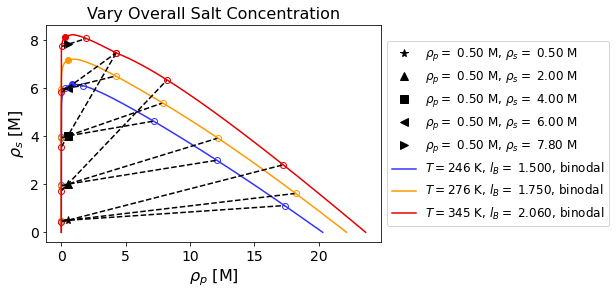

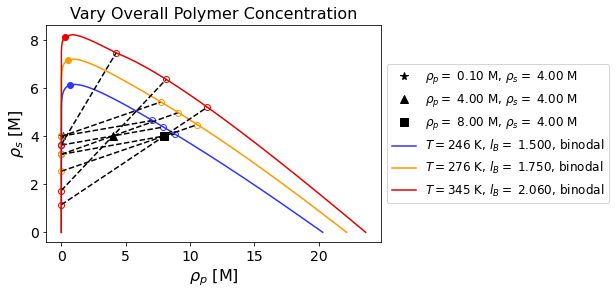

In [18]:
# Parameters
colors = ['#3333ff', '#ff9900', '#e60000']
# list of salt [KBr] concentrations [mol/L]
rho_s_list = [0.5, 2.0, 4.0, 6.0, 7.8]
# list of polyanion [PSS] concentrations [mol/L]
rho_p_list = [0.1, 4.0, 8.0]

################ VARIES SALT CONCENTRATION ###############

# list of Bjerrum lengths to plot
lB_list = [1.5, 1.75, 2.06]

# fixed overall concentration of polymer
rho_p = 0.5 # [M]

# plots binodal
ax = plot.binodal_rho_rho(data, lB_list, rho_s_list, rho_p, 's', beads_2_M, colors=colors)

############ VARIES POLYMER CONCENTRATION ####################

# list of Bjerrum lengths to plot
lB_list = [1.5, 1.75, 2.06]

# fixed overall salt concentration
rho_s  = 4.0 # [M]

# plots binodal
ax = plot.binodal_rho_rho(data, lB_list, rho_p_list, rho_s, 'p', beads_2_M, colors=colors)